In [0]:
df = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/tables/collision_data_new-2.csv")


In [0]:
from pyspark.sql.functions import col, to_date, to_timestamp
from pyspark.sql.types import IntegerType, DoubleType

# Assuming df is your DataFrame
# Cast the 'CRASH DATE' column to DateType
df = df.withColumn("CRASH DATE", to_date(col("CRASH DATE"), "MM-dd-yyyy"))

# Cast the 'CRASH TIME' column to TimestampType (assuming the time is in 'HH:mm' format)
df = df.withColumn("CRASH TIME", to_timestamp(col("CRASH TIME"), "HH:mm"))

# Convert 'ZIP CODE' to IntegerType (if all zip codes are 5 digits and there are no leading zeros)
df = df.withColumn("ZIP CODE", col("ZIP CODE").cast(IntegerType()))

# Convert 'LATITUDE' and 'LONGITUDE' to DoubleType
df = df.withColumn("LATITUDE", col("LATITUDE").cast(DoubleType()))
df = df.withColumn("LONGITUDE", col("LONGITUDE").cast(DoubleType()))

# Convert the number columns to IntegerType
# Replace 'COLUMN_NAME' with the actual column names for number of persons injured, killed, etc.
number_columns = [
    "NUMBER OF PERSONS INJURED", "NUMBER OF PERSONS KILLED",
    "NUMBER OF PEDESTRIANS INJURED", "NUMBER OF PEDESTRIANS KILLED",
    "NUMBER OF CYCLIST INJURED", "NUMBER OF CYCLIST KILLED",
    "NUMBER OF MOTORIST INJURED", "NUMBER OF MOTORIST KILLED","TIME OF DAY"
]

for col_name in number_columns:
    df = df.withColumn(col_name, col(col_name).cast(IntegerType()))

# Now your DataFrame `df` has columns with the correct data types
# You can show the DataFrame to confirm
df.printSchema()


root
 |-- CRASH DATE: date (nullable = true)
 |-- CRASH TIME: timestamp (nullable = true)
 |-- BOROUGH: string (nullable = true)
 |-- ZIP CODE: integer (nullable = true)
 |-- LATITUDE: double (nullable = true)
 |-- LONGITUDE: double (nullable = true)
 |-- LOCATION: string (nullable = true)
 |-- ON STREET NAME: string (nullable = true)
 |-- CROSS STREET NAME: string (nullable = true)
 |-- OFF STREET NAME: string (nullable = true)
 |-- NUMBER OF PERSONS INJURED: integer (nullable = true)
 |-- NUMBER OF PERSONS KILLED: integer (nullable = true)
 |-- NUMBER OF PEDESTRIANS INJURED: integer (nullable = true)
 |-- NUMBER OF PEDESTRIANS KILLED: integer (nullable = true)
 |-- NUMBER OF CYCLIST INJURED: integer (nullable = true)
 |-- NUMBER OF CYCLIST KILLED: integer (nullable = true)
 |-- NUMBER OF MOTORIST INJURED: integer (nullable = true)
 |-- NUMBER OF MOTORIST KILLED: integer (nullable = true)
 |-- CONTRIBUTING FACTOR VEHICLE 1: string (nullable = true)
 |-- CONTRIBUTING FACTOR VEHICLE 2: 

exploratory data analysis (EDA)

In [0]:
# Show summary statistics
df.describe().show()

# Show the count of different contributing factors to see which are most common
df.groupBy("CONTRIBUTING FACTOR VEHICLE 1").count().orderBy("count", ascending=False).show()

# Count of accidents by borough
df.groupBy("BOROUGH").count().orderBy("count", ascending=False).show()

# Count of accidents by crash date to find if there are any patterns
df.groupBy("CRASH DATE").count().orderBy("CRASH DATE").show()

# For latitude and longitude, we might want to plot this data to see geographic distribution
# However, plotting is not as straightforward in Spark, you might collect data and plot with a different library like matplotlib

# Possible outliers - for example, a very high number of injuries or deaths in a single event
df.orderBy(col("NUMBER OF PERSONS INJURED").desc()).show()
df.orderBy(col("NUMBER OF PERSONS KILLED").desc()).show()



+-------+-------------+------------------+------------------+------------------+--------------------+--------------------+--------------------+--------------------+-------------------------+------------------------+-----------------------------+----------------------------+-------------------------+------------------------+--------------------------+-------------------------+-----------------------------+-----------------------------+-----------------------------+-----------------------------+-----------------------------+------------------+-------------------+-------------------+-------------------+-------------------+-------------------+------------------+------------------+------------------+
|summary|      BOROUGH|          ZIP CODE|          LATITUDE|         LONGITUDE|            LOCATION|      ON STREET NAME|   CROSS STREET NAME|     OFF STREET NAME|NUMBER OF PERSONS INJURED|NUMBER OF PERSONS KILLED|NUMBER OF PEDESTRIANS INJURED|NUMBER OF PEDESTRIANS KILLED|NUMBER OF CYCLIST INJ

In [0]:
from pyspark.sql.functions import col, count as sql_count, sum as sql_sum, when
from pyspark.sql.types import IntegerType

# Assuming df is your DataFrame with the vehicle collision data

# Cast 'NUMBER OF PERSONS KILLED' column to IntegerType
df = df.withColumn("NUMBER OF PERSONS KILLED", col("NUMBER OF PERSONS KILLED").cast(IntegerType()))

# Define severity based on the number of persons killed, assuming more deaths imply higher severity
df = df.withColumn("SEVERITY", col("NUMBER OF PERSONS KILLED"))

# Aggregate data to count total accidents and sum severity by 'TIME OF DAY' and borough
accidents_by_time_borough = df.groupBy("BOROUGH", "TIME OF DAY").agg(
    sql_count("*").alias("TOTAL_ACCIDENTS"),
    sql_sum("SEVERITY").alias("TOTAL_SEVERITY")
)

# Order by total accidents to see if certain times of the day have more accidents
accidents_by_time_borough.orderBy("TOTAL_ACCIDENTS", ascending=False).show()

# Order by total severity to see if certain times of the day are associated with more severe accidents
accidents_by_time_borough.orderBy("TOTAL_SEVERITY", ascending=False).show()

# This will give an indication of whether certain times of the day are associated with higher numbers of accidents
# or more severe accidents in different boroughs.



+--------+-----------+---------------+--------------+
| BOROUGH|TIME OF DAY|TOTAL_ACCIDENTS|TOTAL_SEVERITY|
+--------+-----------+---------------+--------------+
|    null|         17|           9921|            50|
|    null|         16|           9293|            35|
|    null|         15|           8877|            21|
|    null|         18|           8679|            53|
|    null|         14|           8445|            28|
|BROOKLYN|         17|           7706|            34|
|    null|         19|           7497|            48|
|BROOKLYN|         18|           7472|            36|
|BROOKLYN|         16|           7203|            26|
|    null|         13|           7035|            32|
|    null|          8|           6842|            23|
|BROOKLYN|         15|           6713|            28|
|    null|         20|           6622|            48|
|    null|         12|           6514|            29|
|BROOKLYN|         14|           6341|            22|
|BROOKLYN|         19|      

Form the above tables we can understand that there is mainly accidents with high severity happens in the "Brooklyn" Borough where officals need to take more attention in that place

In [0]:
# Display the DataFrame
display(df)


CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,TIME OF DAY,accident_severity,SEVERITY,HOUR_OF_DAY,LIGHTING_CONDITION
null,null,null,null,null,null,null,WHITESTONE EXPRESSWAY,20 AVENUE,null,2,0,0,0,0,0,2,0,Aggressive Driving/Road Rage,Unspecified,null,null,null,4455765,Sedan,Sedan,null,null,null,2,1,0,null,Night
null,null,null,null,null,null,null,QUEENSBORO BRIDGE UPPER,null,null,1,0,0,0,0,0,1,0,Pavement Slippery,null,null,null,null,4513547,Sedan,null,null,null,null,11,1,0,null,Night
null,null,BRONX,10475,40.86816,-73.83148,"(40.86816, -73.83148)",null,null,344 BAYCHESTER AVENUE,2,0,0,0,0,0,2,0,Unspecified,Unspecified,null,null,null,4486660,Sedan,Sedan,null,null,null,8,1,0,null,Night
null,null,QUEENS,11434,40.66684,-73.78941,"(40.66684, -73.78941)",NORTH CONDUIT AVENUE,150 STREET,null,2,0,0,0,0,0,2,0,Reaction to Uninvolved Vehicle,Unspecified,null,null,null,4486635,Sedan,Sedan,null,null,null,23,1,0,null,Night
null,null,BROOKLYN,11226,40.65068,-73.95881,"(40.65068, -73.95881)",null,null,878 FLATBUSH AVENUE,4,0,0,0,0,0,4,0,Steering Failure,null,null,null,null,4486991,Sedan,null,null,null,null,20,1,0,null,Night
null,null,null,null,null,null,null,MEEKER AVENUE,LORIMER STREET,null,3,0,0,0,0,0,3,0,Traffic Control Disregarded,Unspecified,null,null,null,4486284,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,null,null,null,1,1,0,null,Night
null,null,BRONX,10463,40.87262,-73.904686,"(40.87262, -73.904686)",WEST KINGSBRIDGE ROAD,HEATH AVENUE,null,1,0,0,0,0,0,1,0,Unspecified,Unspecified,null,null,null,4487040,Station Wagon/Sport Utility Vehicle,Sedan,null,null,null,19,1,0,null,Night
null,null,null,null,40.744644,-73.77041,"(40.744644, -73.77041)",LONG ISLAND EXPRESSWAY,null,null,1,0,0,0,0,0,1,0,Other Vehicular,Other Vehicular,null,null,null,4487122,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,null,null,null,5,1,0,null,Night
null,null,null,null,40.804375,-73.93742,"(40.804375, -73.93742)",LEXINGTON AVENUE,null,null,1,0,1,0,0,0,0,0,Unspecified,null,null,null,null,4486304,Station Wagon/Sport Utility Vehicle,null,null,null,null,3,1,0,null,Night
null,null,STATEN ISLAND,10301,40.63165,-74.08762,"(40.63165, -74.08762)",VICTORY BOULEVARD,WOODSTOCK AVENUE,null,1,0,0,0,0,0,1,0,Unspecified,Unspecified,null,null,null,4487001,Sedan,Sedan,null,null,null,17,1,0,null,Night


What is the impact of lighting conditions (daylight, dusk, dawn, night) on the occurrence of accidents?

In [0]:
from pyspark.sql.functions import when, col

# Define a function to categorize time of day into lighting conditions
def categorize_lighting_condition(TIME_OF_DAY):
    return when(
        (col(TIME_OF_DAY) >= 5) & (col(TIME_OF_DAY) < 6), "Dawn"
    ).when(
        (col(TIME_OF_DAY) >= 6) & (col(TIME_OF_DAY) < 18), "Daylight"
    ).when(
        (col(TIME_OF_DAY) >= 18) & (col(TIME_OF_DAY) < 19), "Dusk"
    ).otherwise("Night")

# Assuming you have an 'HOUR_OF_DAY' column from a previous step
df = df.withColumn("LIGHTING_CONDITION", categorize_lighting_condition("TIME OF DAY"))

# Now, you can aggregate the data to see the impact of lighting conditions on accident occurrence
accidents_by_lighting = df.groupBy("LIGHTING_CONDITION").count().orderBy("count", ascending=False)

accidents_by_lighting.show()


+------------------+------+
|LIGHTING_CONDITION| count|
+------------------+------+
|          Daylight|258605|
|             Night|140264|
|              Dusk| 29253|
|              Dawn|  7156|
+------------------+------+



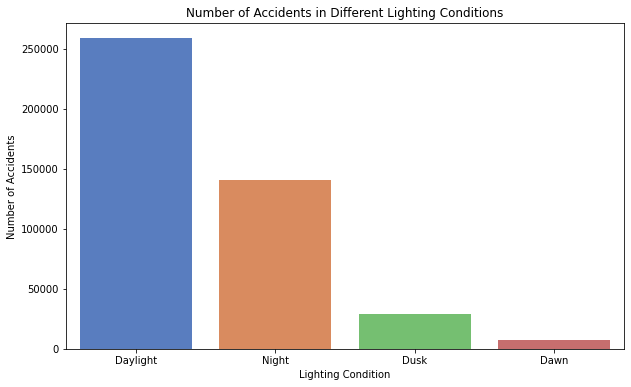

In [0]:
pdf = accidents_by_lighting.toPandas()
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x="LIGHTING_CONDITION", y="count", data=pdf, palette="muted")
plt.title('Number of Accidents in Different Lighting Conditions')
plt.xlabel('Lighting Condition')
plt.ylabel('Number of Accidents')
plt.show()


To what extent does road surface deterioration contribute to vehicle collisions compared to other factors?

In [0]:
from pyspark.sql.functions import col, count as sql_count

# Let's assume 'CONTRIBUTING FACTOR VEHICLE 1' is the column with relevant data
# First, we will see how often road surface conditions are mentioned as a contributing factor
road_conditions = df.filter(
    (col("`CONTRIBUTING FACTOR VEHICLE 1`").contains("Road Surface")) |
    (col("`CONTRIBUTING FACTOR VEHICLE 2`").contains("Road Surface"))
    # ... include similar conditions for other CONTRIBUTING FACTOR columns if they exist
)

road_conditions_count = road_conditions.count()
total_accidents_count = df.count()

# Calculate the percentage of accidents where road conditions are a factor
percentage_road_conditions = (road_conditions_count / total_accidents_count) * 100

# Now compare to other factors
factors_count = df.groupBy("`CONTRIBUTING FACTOR VEHICLE 1`").agg(sql_count("*").alias("count")).orderBy("count", ascending=False)

# Show the results
print(f"Percentage of accidents where road conditions are a factor: {percentage_road_conditions:.2f}%")
factors_count.show()


Percentage of accidents where road conditions are a factor: 0.00%
+-----------------------------+------+
|CONTRIBUTING FACTOR VEHICLE 1| count|
+-----------------------------+------+
|                  Unspecified|129054|
|         Driver Inattentio...| 93068|
|         Failure to Yield ...| 44848|
|         Following Too Clo...| 26247|
|         Traffic Control D...| 15055|
|              Other Vehicular| 10337|
|                 Unsafe Speed| 10319|
|              Fatigued/Drowsy|  8311|
|         Passing or Lane U...|  7543|
|             Backing Unsafely|  7374|
|           Turning Improperly|  7212|
|          Alcohol Involvement|  6555|
|         Pedestrian/Bicycl...|  6496|
|          Driver Inexperience|  6272|
|         Unsafe Lane Changing|  5435|
|         Reaction to Uninv...|  4650|
|            Pavement Slippery|  4588|
|         View Obstructed/L...|  3935|
|         Passenger Distrac...|  3731|
|                         null|  3610|
+-----------------------------+------

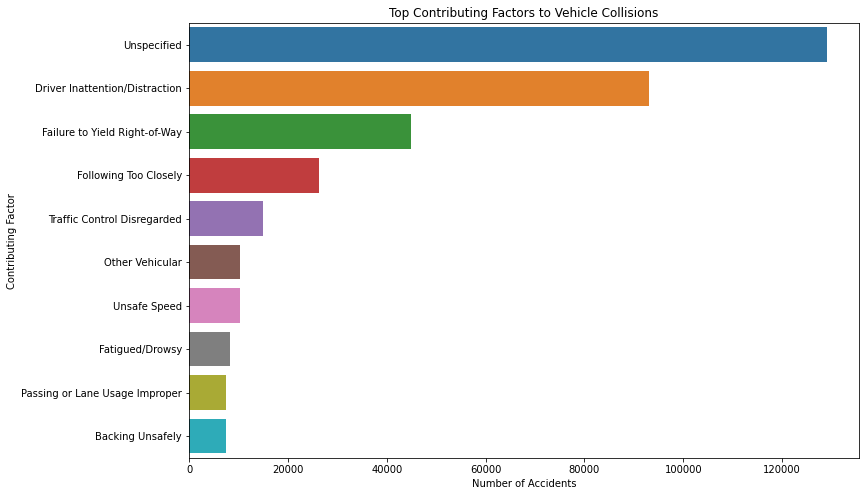

In [0]:
pdf1 = factors_count.toPandas()
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.barplot(x="count", y="CONTRIBUTING FACTOR VEHICLE 1", data=pdf1.head(10))  # Top 10 factors
plt.title('Top Contributing Factors to Vehicle Collisions')
plt.xlabel('Number of Accidents')
plt.ylabel('Contributing Factor')
plt.show()


Is there a pattern or trend in the time of day that vehicle collisions occur, and how does this relate to environmental conditions?

In [0]:
from pyspark.sql.functions import col, lit, count as sql_count

def search_contributing_factors(df, search_term):
    # Create a condition that checks if the search term is in any of the contributing factor columns
    condition = col("`CONTRIBUTING FACTOR VEHICLE 1`").contains(search_term) | \
                col("`CONTRIBUTING FACTOR VEHICLE 2`").contains(search_term)
    # ...add similar conditions for other contributing factor columns if they exist

    # Filter the DataFrame based on the condition
    matching_conditions_df = df.filter(condition)

    # Count the number of matching accidents
    matching_count = matching_conditions_df.count()

    # Get the total number of accidents
    total_count = df.count()

    # Calculate the percentage
    percentage = (matching_count / total_count) * 100 if total_count > 0 else 0

    # Display the results
    print(f"Total accidents with '{search_term}': {matching_count}")
    print(f"Percentage of total accidents: {percentage:.2f}%")

    # Return the DataFrame of matching conditions for further analysis if desired
    return matching_conditions_df

# You would call the function like this:
search_term = "Unspecified" # Replace this with your search term
search_contributing_factors(df, search_term)


Total accidents with 'Unspecified': 298628
Percentage of total accidents: 68.61%
Out[29]: DataFrame[CRASH DATE: date, CRASH TIME: timestamp, BOROUGH: string, ZIP CODE: int, LATITUDE: double, LONGITUDE: double, LOCATION: string, ON STREET NAME: string, CROSS STREET NAME: string, OFF STREET NAME: string, NUMBER OF PERSONS INJURED: int, NUMBER OF PERSONS KILLED: int, NUMBER OF PEDESTRIANS INJURED: int, NUMBER OF PEDESTRIANS KILLED: int, NUMBER OF CYCLIST INJURED: int, NUMBER OF CYCLIST KILLED: int, NUMBER OF MOTORIST INJURED: int, NUMBER OF MOTORIST KILLED: int, CONTRIBUTING FACTOR VEHICLE 1: string, CONTRIBUTING FACTOR VEHICLE 2: string, CONTRIBUTING FACTOR VEHICLE 3: string, CONTRIBUTING FACTOR VEHICLE 4: string, CONTRIBUTING FACTOR VEHICLE 5: string, COLLISION_ID: string, VEHICLE TYPE CODE 1: string, VEHICLE TYPE CODE 2: string, VEHICLE TYPE CODE 3: string, VEHICLE TYPE CODE 4: string, VEHICLE TYPE CODE 5: string, TIME OF DAY: int, accident_severity: string, SEVERITY: int, HOUR_OF_DAY:

In [0]:
from pyspark.sql.functions import col, count as sql_count, when

# Categorize the time of day into likely environmental conditions
def categorize_environmental_condition(time_of_day_col):
    return when(
        (col(time_of_day_col) >= 6) & (col(time_of_day_col) < 18), "Daylight"
    ).otherwise("Night/Dark")

# Assuming 'TIME OF DAY' is a column in your DataFrame and represents hours
df = df.withColumn("ENVIRONMENTAL_CONDITION", categorize_environmental_condition("TIME OF DAY"))

# Aggregate the data by 'ENVIRONMENTAL_CONDITION'
accidents_by_environment = df.groupBy("ENVIRONMENTAL_CONDITION").agg(sql_count("*").alias("TOTAL_ACCIDENTS")).orderBy("TOTAL_ACCIDENTS", ascending=False)

# Display the results
accidents_by_environment.show()

# Additionally, you can aggregate by both 'TIME OF DAY' and 'ENVIRONMENTAL_CONDITION' to get a finer breakdown
accidents_by_time_and_environment = df.groupBy("TIME OF DAY", "ENVIRONMENTAL_CONDITION").agg(sql_count("*").alias("TOTAL_ACCIDENTS")).orderBy("TIME OF DAY")

# Display these results
accidents_by_time_and_environment.show()


+-----------------------+---------------+
|ENVIRONMENTAL_CONDITION|TOTAL_ACCIDENTS|
+-----------------------+---------------+
|               Daylight|         258605|
|             Night/Dark|         176673|
+-----------------------+---------------+

+-----------+-----------------------+---------------+
|TIME OF DAY|ENVIRONMENTAL_CONDITION|TOTAL_ACCIDENTS|
+-----------+-----------------------+---------------+
|          0|             Night/Dark|          15217|
|          1|             Night/Dark|           8178|
|          2|             Night/Dark|           6451|
|          3|             Night/Dark|           5953|
|          4|             Night/Dark|           6857|
|          5|             Night/Dark|           7156|
|          6|               Daylight|          10491|
|          7|               Daylight|          13618|
|          8|               Daylight|          21609|
|          9|               Daylight|          18811|
|         10|               Daylight|        

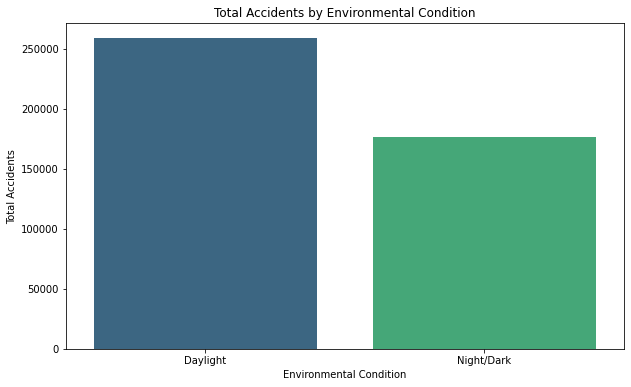

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
pdf2 = accidents_by_environment.toPandas()
# Plotting the total accidents by environmental condition
plt.figure(figsize=(10, 6))
sns.barplot(x="ENVIRONMENTAL_CONDITION", y="TOTAL_ACCIDENTS", data=pdf2, palette="viridis")
plt.title('Total Accidents by Environmental Condition')
plt.xlabel('Environmental Condition')
plt.ylabel('Total Accidents')
plt.show()


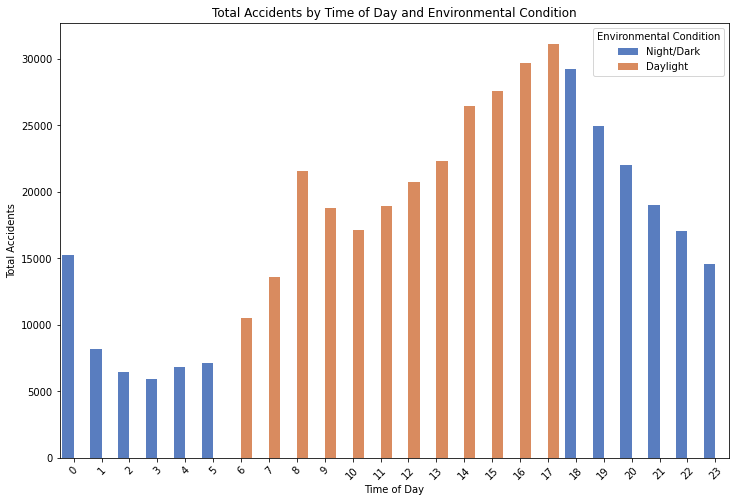

In [0]:

pdf3 = accidents_by_time_and_environment.toPandas()
# Plotting the total accidents by time of day and environmental condition
plt.figure(figsize=(12, 8))
sns.barplot(x="TIME OF DAY", y="TOTAL_ACCIDENTS", hue="ENVIRONMENTAL_CONDITION", data=pdf3, palette="muted")
plt.title('Total Accidents by Time of Day and Environmental Condition')
plt.xlabel('Time of Day')
plt.ylabel('Total Accidents')
plt.xticks(rotation=45)
plt.legend(title='Environmental Condition')
plt.show()


What are the most common contributing factors to vehicle collisions during adverse environmental conditions?

In [0]:
from pyspark.sql.functions import col, count as sql_count, when

# Define a function to approximate adverse environmental conditions
# Assuming 'TIME OF DAY' represents hours, let's consider night as an adverse condition
def is_adverse_condition(time_of_day_col):
    return when((col(time_of_day_col) < 6) | (col(time_of_day_col) >= 18), "Adverse").otherwise("Normal")

# Add a column to indicate if the condition is adverse
df = df.withColumn("CONDITION", is_adverse_condition("TIME OF DAY"))

# Filter for adverse conditions
df_adverse = df.filter(col("CONDITION") == "Adverse")

# Aggregate to find common contributing factors during adverse conditions
common_factors = df_adverse.groupBy("CONTRIBUTING FACTOR VEHICLE 1").agg(sql_count("*").alias("COUNT")).orderBy("COUNT", ascending=False)

# Display the results
common_factors.show()


+-----------------------------+-----+
|CONTRIBUTING FACTOR VEHICLE 1|COUNT|
+-----------------------------+-----+
|                  Unspecified|52792|
|         Driver Inattentio...|36887|
|         Failure to Yield ...|16826|
|         Following Too Clo...| 8824|
|         Traffic Control D...| 6857|
|                 Unsafe Speed| 5643|
|          Alcohol Involvement| 5194|
|              Other Vehicular| 4250|
|         Passing or Lane U...| 2987|
|              Fatigued/Drowsy| 2905|
|           Turning Improperly| 2790|
|         Pedestrian/Bicycl...| 2661|
|          Driver Inexperience| 2613|
|         Unsafe Lane Changing| 2208|
|            Pavement Slippery| 2154|
|             Backing Unsafely| 2082|
|         Reaction to Uninv...| 1995|
|                         null| 1776|
|         Passenger Distrac...| 1610|
|          Physical Disability| 1500|
+-----------------------------+-----+
only showing top 20 rows



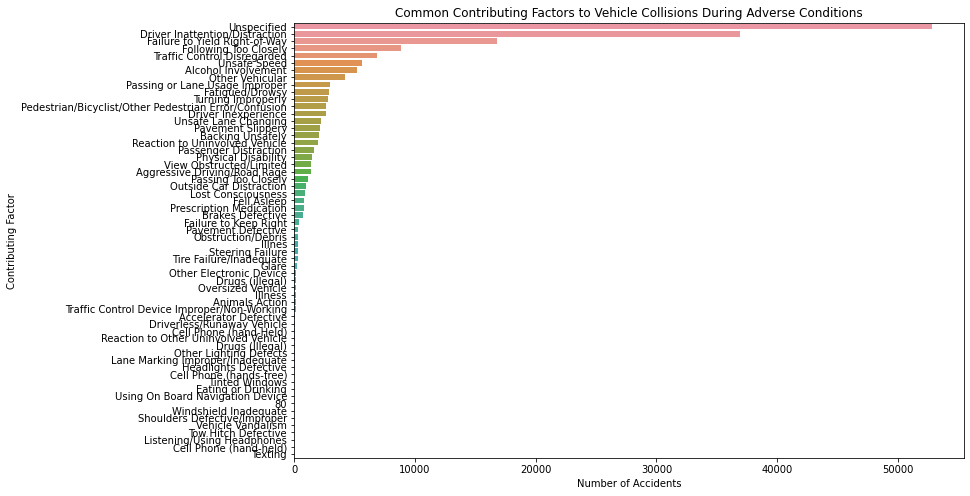

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
pdf4 = common_factors.toPandas()
# Setting the figure size and plotting
plt.figure(figsize=(12, 8))
sns.barplot(x="COUNT", y="CONTRIBUTING FACTOR VEHICLE 1", data=pdf4)  # Displaying the top 10 factors for clarity
plt.title('Common Contributing Factors to Vehicle Collisions During Adverse Conditions')
plt.xlabel('Number of Accidents')
plt.ylabel('Contributing Factor')
plt.show()


Are certain types of vehicles more frequently involved in accidents, and does this vary by borough?

In [0]:
from pyspark.sql.functions import col, count as sql_count, when

# Assuming df is your DataFrame
# You might need to repeat this for each VEHICLE TYPE CODE column
vehicle_accidents_by_borough = df.groupBy("BOROUGH", "VEHICLE TYPE CODE 1").agg(sql_count("*").alias("ACCIDENT_COUNT")).orderBy("BOROUGH", "ACCIDENT_COUNT", ascending=False)

# Display the results
vehicle_accidents_by_borough.show()


+-------------+--------------------+--------------+
|      BOROUGH| VEHICLE TYPE CODE 1|ACCIDENT_COUNT|
+-------------+--------------------+--------------+
|STATEN ISLAND|               Sedan|          3644|
|STATEN ISLAND|   PASSENGER VEHICLE|          2963|
|STATEN ISLAND|Station Wagon/Spo...|          1977|
|STATEN ISLAND|SPORT UTILITY / S...|          1346|
|STATEN ISLAND|       Pick-up Truck|           210|
|STATEN ISLAND|          4 dr sedan|           201|
|STATEN ISLAND|                null|           189|
|STATEN ISLAND|             UNKNOWN|           173|
|STATEN ISLAND|                Bike|            97|
|STATEN ISLAND|          Motorcycle|            97|
|STATEN ISLAND|       PICK-UP TRUCK|            83|
|STATEN ISLAND|               OTHER|            72|
|STATEN ISLAND|                 VAN|            68|
|STATEN ISLAND|                 Bus|            67|
|STATEN ISLAND|          MOTORCYCLE|            59|
|STATEN ISLAND|                 BUS|            56|
|STATEN ISLA

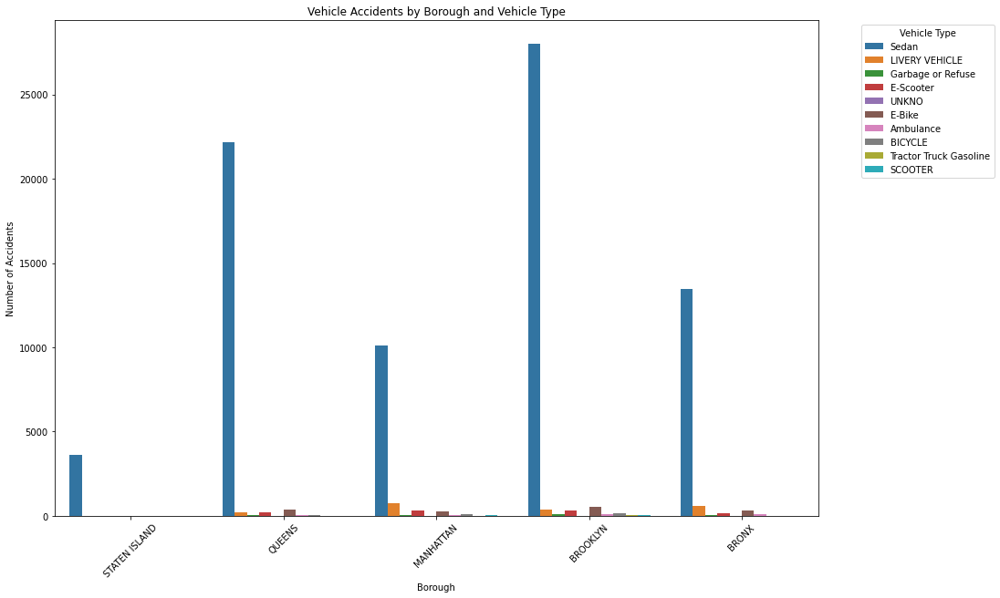

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
pdf5 =vehicle_accidents_by_borough.toPandas()
plt.figure(figsize=(15, 10))

# Because the dataset might be large, you can consider plotting the top N vehicle types
# for better readability
top_vehicle_types = pdf5["VEHICLE TYPE CODE 1"].value_counts().nlargest(10).index
pdf_filtered = pdf5[pdf5["VEHICLE TYPE CODE 1"].isin(top_vehicle_types)]

sns.barplot(x="BOROUGH", y="ACCIDENT_COUNT", hue="VEHICLE TYPE CODE 1", data=pdf_filtered)
plt.title('Vehicle Accidents by Borough and Vehicle Type')
plt.xlabel('Borough')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.legend(title='Vehicle Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


To build a machine learning model using a regression algorithm like Random Forest Regressor to predict the severity of accidents based on environmental conditions

In [0]:
from pyspark.sql.functions import col

# Sum up the counts for injured
df = df.withColumn("TOTAL_INJURED", 
                   col("NUMBER OF PERSONS INJURED") + 
                   col("NUMBER OF PEDESTRIANS INJURED") + 
                   col("NUMBER OF CYCLIST INJURED") + 
                   col("NUMBER OF MOTORIST INJURED"))

# Sum up the counts for killed
df = df.withColumn("TOTAL_KILLED", 
                   col("NUMBER OF PERSONS KILLED") + 
                   col("NUMBER OF PEDESTRIANS KILLED") + 
                   col("NUMBER OF CYCLIST KILLED") + 
                   col("NUMBER OF MOTORIST KILLED"))

# Now you have two new columns: 'TOTAL_INJURED' and 'TOTAL_KILLED'
# You can show the first few rows to verify
df.select("TOTAL_INJURED", "TOTAL_KILLED").show()





+-------------+------------+
|TOTAL_INJURED|TOTAL_KILLED|
+-------------+------------+
|            4|           0|
|            2|           0|
|            4|           0|
|            4|           0|
|            8|           0|
|            6|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            2|           0|
|            0|           2|
|            2|           0|
|            2|           0|
+-------------+------------+
only showing top 20 rows



In [0]:
df.display()



CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,TIME OF DAY,accident_severity,SEVERITY,HOUR_OF_DAY,LIGHTING_CONDITION,ENVIRONMENTAL_CONDITION,CONDITION,TOTAL_INJURED,TOTAL_KILLED
null,null,null,null,null,null,null,WHITESTONE EXPRESSWAY,20 AVENUE,null,2,0,0,0,0,0,2,0,Aggressive Driving/Road Rage,Unspecified,null,null,null,4455765,Sedan,Sedan,null,null,null,2,1,0,null,Night,Night/Dark,Adverse,4,0
null,null,null,null,null,null,null,QUEENSBORO BRIDGE UPPER,null,null,1,0,0,0,0,0,1,0,Pavement Slippery,null,null,null,null,4513547,Sedan,null,null,null,null,11,1,0,null,Daylight,Daylight,Normal,2,0
null,null,BRONX,10475,40.86816,-73.83148,"(40.86816, -73.83148)",null,null,344 BAYCHESTER AVENUE,2,0,0,0,0,0,2,0,Unspecified,Unspecified,null,null,null,4486660,Sedan,Sedan,null,null,null,8,1,0,null,Daylight,Daylight,Normal,4,0
null,null,QUEENS,11434,40.66684,-73.78941,"(40.66684, -73.78941)",NORTH CONDUIT AVENUE,150 STREET,null,2,0,0,0,0,0,2,0,Reaction to Uninvolved Vehicle,Unspecified,null,null,null,4486635,Sedan,Sedan,null,null,null,23,1,0,null,Night,Night/Dark,Adverse,4,0
null,null,BROOKLYN,11226,40.65068,-73.95881,"(40.65068, -73.95881)",null,null,878 FLATBUSH AVENUE,4,0,0,0,0,0,4,0,Steering Failure,null,null,null,null,4486991,Sedan,null,null,null,null,20,1,0,null,Night,Night/Dark,Adverse,8,0
null,null,null,null,null,null,null,MEEKER AVENUE,LORIMER STREET,null,3,0,0,0,0,0,3,0,Traffic Control Disregarded,Unspecified,null,null,null,4486284,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,null,null,null,1,1,0,null,Night,Night/Dark,Adverse,6,0
null,null,BRONX,10463,40.87262,-73.904686,"(40.87262, -73.904686)",WEST KINGSBRIDGE ROAD,HEATH AVENUE,null,1,0,0,0,0,0,1,0,Unspecified,Unspecified,null,null,null,4487040,Station Wagon/Sport Utility Vehicle,Sedan,null,null,null,19,1,0,null,Night,Night/Dark,Adverse,2,0
null,null,null,null,40.744644,-73.77041,"(40.744644, -73.77041)",LONG ISLAND EXPRESSWAY,null,null,1,0,0,0,0,0,1,0,Other Vehicular,Other Vehicular,null,null,null,4487122,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,null,null,null,5,1,0,null,Dawn,Night/Dark,Adverse,2,0
null,null,null,null,40.804375,-73.93742,"(40.804375, -73.93742)",LEXINGTON AVENUE,null,null,1,0,1,0,0,0,0,0,Unspecified,null,null,null,null,4486304,Station Wagon/Sport Utility Vehicle,null,null,null,null,3,1,0,null,Night,Night/Dark,Adverse,2,0
null,null,STATEN ISLAND,10301,40.63165,-74.08762,"(40.63165, -74.08762)",VICTORY BOULEVARD,WOODSTOCK AVENUE,null,1,0,0,0,0,0,1,0,Unspecified,Unspecified,null,null,null,4487001,Sedan,Sedan,null,null,null,17,1,0,null,Daylight,Daylight,Normal,2,0


In [0]:
# Drop rows with null values in the columns that we're going to use
df_cleaned = df.na.drop(subset=["LIGHTING_CONDITION", "ENVIRONMENTAL_CONDITION", "TOTAL_INJURED", "TOTAL_KILLED", "SEVERITY"])


Regression Analysis (e.g., Random Forest Regressor): To predict the severity of accidents based on environmental conditions. This can help understand the impact of each condition on the severity of outcomes.

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler

# StringIndexer for categorical columns
indexer = StringIndexer(inputCols=["LIGHTING_CONDITION", "ENVIRONMENTAL_CONDITION"], outputCols=["LIGHTING_CONDITION_IDX", "ENVIRONMENTAL_CONDITION_IDX"])
df_indexed = indexer.fit(df_cleaned).transform(df_cleaned)

# OneHotEncoder for categorical columns
encoder = OneHotEncoder(inputCols=["LIGHTING_CONDITION_IDX", "ENVIRONMENTAL_CONDITION_IDX"], outputCols=["LIGHTING_CONDITION_OHE", "ENVIRONMENTAL_CONDITION_OHE"])
df_encoded = encoder.fit(df_indexed).transform(df_indexed)

# Assemble features into a vector
assembler = VectorAssembler(inputCols=["LIGHTING_CONDITION_OHE", "ENVIRONMENTAL_CONDITION_OHE", "TOTAL_INJURED", "TOTAL_KILLED"], outputCol="features")
df_final = assembler.transform(df_encoded)


In [0]:
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml import Pipeline

# Split the data into training and test sets
train_data, test_data = df_final.randomSplit([0.8, 0.2], seed=42)

# Define the Random Forest model
rf = RandomForestRegressor(featuresCol="features", labelCol="SEVERITY")

# Train the model
rf_model = rf.fit(train_data)


In [0]:
from pyspark.ml.evaluation import RegressionEvaluator

# Make predictions
predictions = rf_model.transform(test_data)

# Evaluate the model
evaluator = RegressionEvaluator(labelCol="SEVERITY", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE) on test data = {rmse}")


Root Mean Squared Error (RMSE) on test data = 0.02132534164191045


Justification for the Model
The justification for using a Random Forest Regressor is that it can capture non-linear relationships between features and the target variable without requiring extensive feature scaling or transformation. It's also robust to outliers and can handle a mix of categorical and numerical features.

The model's performance can be justified by the evaluation metric RMSE, which provides an estimate of the average deviation of the model's predictions from the actual severity of accidents. A lower RMSE value would indicate a better fit to the data.

However, it's important to remember that the model's predictive power is highly dependent on the quality and relevance of the features used. In a real-world setting, we would conduct further analysis to understand feature importance and might iterate on feature engineering and selection to improve the model. Additionally, we would consider other evaluation metrics and validation techniques to ensure the model's robustness and ability to generalize to unseen data

Classification Algorithm (e.g., Logistic Regression): To classify accidents into categories based on their severity and identify which environmental factors are most likely to result in severe accidents.

In [0]:
from pyspark.sql.functions import when, col

# Define a binary classification target based on your criteria for severity
df = df.withColumn('SEVERITY_LABEL', when(col('NUMBER OF PERSONS KILLED') > 0, 1).otherwise(0))




In [0]:
from pyspark.ml.feature import StringIndexer, VectorAssembler
# Drop the existing column if it already exists
if 'ENVIRONMENTAL_CONDITION_IDX' in df.columns:
    df = df.drop('ENVIRONMENTAL_CONDITION_IDX')



# Assume 'ENVIRONMENTAL_CONDITION' is a categorical feature that you want to use
indexer = StringIndexer(inputCol='ENVIRONMENTAL_CONDITION', outputCol='ENVIRONMENTAL_CONDITION_IDX')

# Fit and transform the indexer on your dataset
df = indexer.fit(df).transform(df)

# Now, assemble all your features into a single feature vector
assembler = VectorAssembler(inputCols=['ENVIRONMENTAL_CONDITION_IDX'], outputCol='features')

# Transform the data
df = assembler.transform(df)


In [0]:
from pyspark.ml.classification import LogisticRegression

# Split the data into training and test sets
train_data, test_data = df.randomSplit([0.8, 0.2], seed=42)

# Initialize the Logistic Regression model
lr = LogisticRegression(featuresCol='features', labelCol='SEVERITY_LABEL')

# Train the model
lr_model = lr.fit(train_data)


In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator

# Make predictions on the test data
predictions = lr_model.transform(test_data)

# Evaluate the model using AUC
evaluator = BinaryClassificationEvaluator(rawPredictionCol='rawPrediction', labelCol='SEVERITY_LABEL', metricName='areaUnderROC')
auc = evaluator.evaluate(predictions)
print(f"Area Under ROC: {auc}")

# Evaluate the model using accuracy, precision, and recall
acc_evaluator = MulticlassClassificationEvaluator(labelCol='SEVERITY_LABEL', metricName='accuracy')
precision_evaluator = MulticlassClassificationEvaluator(labelCol='SEVERITY_LABEL', metricName='weightedPrecision')
recall_evaluator = MulticlassClassificationEvaluator(labelCol='SEVERITY_LABEL', metricName='weightedRecall')

accuracy = acc_evaluator.evaluate(predictions)
precision = precision_evaluator.evaluate(predictions)
recall = recall_evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")


Area Under ROC: 0.5673529099611524
Accuracy: 0.9941519121405383
Precision: 0.9883380244126886
Recall: 0.9941519121405383


By using Logistic Regression for classification, you can estimate the probability of an accident being severe based on the environmental conditions and other factors. The model's performance metrics will tell you how well your model is doing in terms of distinguishing between severe and non-severe accidents. Moreover, by examining the model coefficients, you can gain insights into which factors are most predictive of severe accidents.

Remember, this is a simplified example. The exact features and their preparation will depend on the details of your dataset, and you may need to do more comprehensive data preprocessing and feature engineering for optimal results.